# Basics

In [1]:
using OnlineStats

┌ Info: Recompiling stale cache file /Users/joshday/.julia/compiled/v1.0/OnlineStats/G3mU6.ji for OnlineStats [a15396b6-48d5-5d58-9928-6d29437db91e]
└ @ Base loading.jl:1184


## Stats are types

In [18]:
m = Mean()

Mean: n=0 | value=0.0

## Stats can be updated

In [19]:
fit!(m, 1.0)
fit!(m, [2, 3])
fit!(m, (4, 5, 6, 7))

Mean: n=7 | value=4.0

## Stats can be merged

In [20]:
m2 = fit!(Mean(), 8:14)

merge!(m, m2)  # merge m2 into m

Mean: n=14 | value=7.5

# Categories of Stats

## 1. Statistics

In [21]:
Mean()

Mean: n=0 | value=0.0

In [22]:
Variance()

Variance: n=0 | value=1.0

In [25]:
P2Quantile(.5)

P2Quantile(0.5, 0.0)

## 2. Collections of Statistics

- Apply multiple stats to the same data with `Series`.
- "Broadcast" stats to different data with `Group`.

In [26]:
o = Series(Mean(), Variance())

fit!(o, randn(100))

Series
  ├── Mean: n=100 | value=0.0262534
  └── Variance: n=100 | value=1.03444

In [27]:
o = Group(Mean(), Mean())

fit!(o, randn(100, 2))

Group
  ├── Mean: n=100 | value=-0.00493309
  └── Mean: n=100 | value=-0.00338425

# 3. Models

- Models accept data as `(x, y)`

In [33]:
x = randn(10^6, 5)
y = x * (1:5) + randn(10^6);

In [34]:
o = LinReg()

fit!(o, (x, y))

LinReg: n=1000000 | value=[0.998753, 2.00012, 3.00058, 4.0001, 4.99991]

In [36]:
o = StatLearn(5, L2DistLoss(), SGD())

fit!(o, (x, y))
coef(o)'

1×5 LinearAlgebra.Adjoint{Float64,Array{Float64,1}}:
 0.974651  2.0003  3.00135  3.97789  4.99192

# 4. Data Viz

In [41]:
using Plots

┌ Info: Recompiling stale cache file /Users/joshday/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


┌ Info: Recompiling stale cache file /Users/joshday/.julia/compiled/v1.0/GR/NDU5Y.ji for GR [28b8d3ca-fb5f-59d9-8090-bfdbd6d07a71]
└ @ Base loading.jl:1184


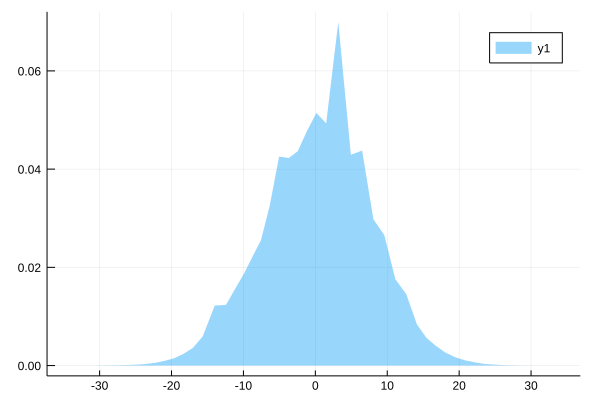

In [44]:
o = fit!(Hist(50), y)

plot(o)